<a href="https://colab.research.google.com/github/manashpratim/Credit-Card-Fraud-Detection/blob/master/Credit_Card_Fraud_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
#Downloading the datasets
!wget --no-check-certificate \
      "https://storage.googleapis.com/kaggle-datasets/310/23498/creditcard.csv.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1562721163&Signature=lKgMRa8IcH6AS7NkjifskUJ6OTxOXzkifDU2FmnNkmDl9M1Q7qZxM2qjprsTMDNWnd0yQc79TQ8SQdiO8ZHQY0T1nR2T3OQFDfGGVBEceCzmXz33fcPnweAQNM70jP3FFeuvdHJFHKm6Qcoy0K2ohZlwmLC18vEPuxs8uDadYOnzgO6iSk4TRZ2TnOe%2FxHU9mMqDKxZTtgWh3I2JeQswcZo8%2FYcW0xRbekV4Me76roOwpyk1y1z%2F6Ik19ZVuES9t2IIOkzKxuhf5svK9DFY%2F68q0thEprqyMblJ7jpWwWN1%2FmGoUJQ%2B8ZE1HIPPam7j2VLR8ZSjQsaqopMMLXl7N1w%3D%3D"\
      -O "/tmp/creditcard.zip"

--2019-07-07 01:13:46--  https://storage.googleapis.com/kaggle-datasets/310/23498/creditcard.csv.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1562721163&Signature=lKgMRa8IcH6AS7NkjifskUJ6OTxOXzkifDU2FmnNkmDl9M1Q7qZxM2qjprsTMDNWnd0yQc79TQ8SQdiO8ZHQY0T1nR2T3OQFDfGGVBEceCzmXz33fcPnweAQNM70jP3FFeuvdHJFHKm6Qcoy0K2ohZlwmLC18vEPuxs8uDadYOnzgO6iSk4TRZ2TnOe%2FxHU9mMqDKxZTtgWh3I2JeQswcZo8%2FYcW0xRbekV4Me76roOwpyk1y1z%2F6Ik19ZVuES9t2IIOkzKxuhf5svK9DFY%2F68q0thEprqyMblJ7jpWwWN1%2FmGoUJQ%2B8ZE1HIPPam7j2VLR8ZSjQsaqopMMLXl7N1w%3D%3D
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.126.128, 2607:f8b0:4001:c03::80
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.126.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 69155632 (66M) [application/zip]
Saving to: ‘/tmp/creditcard.zip’

/tmp/creditcard.zip 100%[===================>]  65.95M  44.4MB/s    in 1.5s    

2019-07-07 01:13:47 (44.4 MB/s) - ‘/tmp/creditca

In [0]:
# Unzipping the downloaded dataset
import os
import zipfile

local_zip='/tmp/creditcard.zip'
zip_ref=zipfile.ZipFile(local_zip,'r')
zip_ref.extractall('/tmp/creditcard')
zip_ref.close()

In [0]:
import pandas as pd
df=pd.read_csv('/tmp/creditcard/creditcard.csv')

In [5]:
df.head(3)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0


Class Distribution:
 0    284315
1       492
Name: Class, dtype: int64


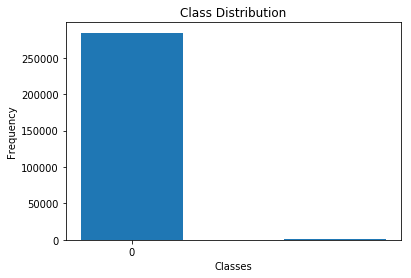

In [11]:
#Class Distribution
import numpy as np
import matplotlib.pyplot as plt
plt.bar([0,1], df['Class'].value_counts(), width=0.5, bottom=None, align='center', data=df)
plt.title('Class Distribution')
plt.xlabel('Classes')
plt.ylabel('Frequency')
plt.xticks(np.arange(0, 1, step=2))
print('Class Distribution:\n',df['Class'].value_counts())

### **From the above graph, we can see that the dataset is highly imbalanced.**

/usr/local/lib/python3.6/dist-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/usr/local/lib/python3.6/dist-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


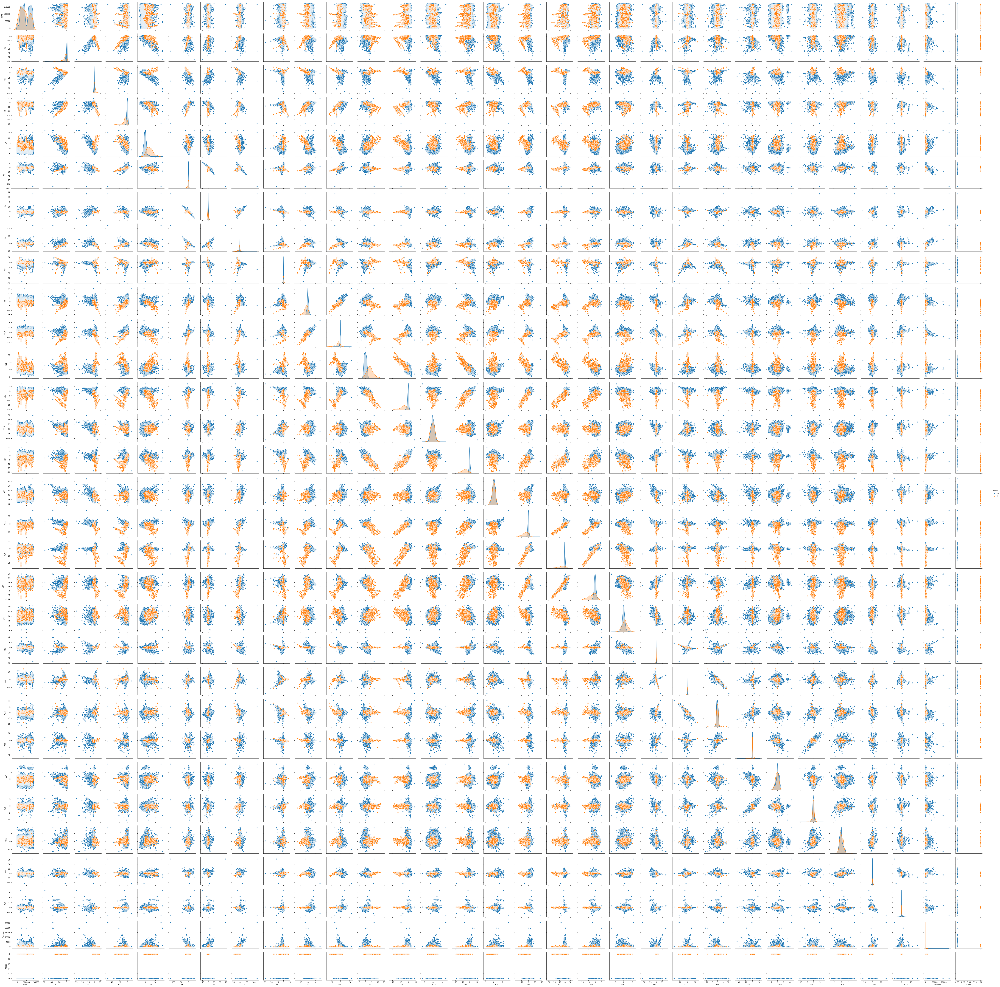

In [21]:
import seaborn as sns
sns.pairplot(df,hue='Class')
#g.set(xticklabels=[])

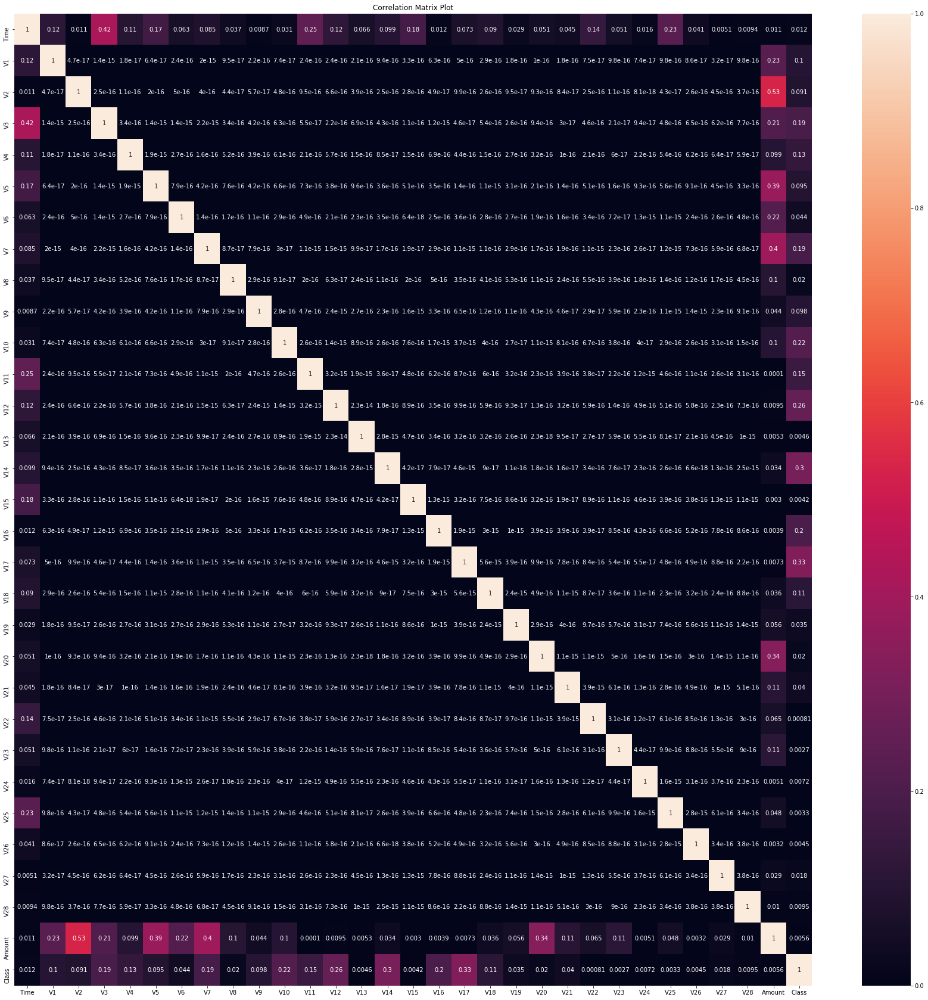

In [27]:
# calculate the correlation matrix
corr = df.corr().abs()
# plot the heatmap
fig, ax = plt.subplots(figsize=(30,30))  
plt.title('Correlation Matrix Plot')
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns,annot=True,ax=ax)

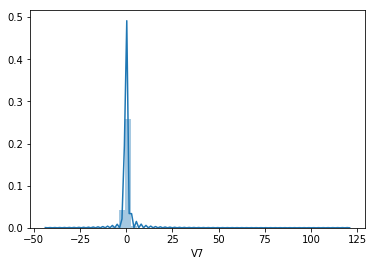

In [19]:
import seaborn as sns
sns.distplot(df['V7'])

([], <a list of 0 Text xticklabel objects>)

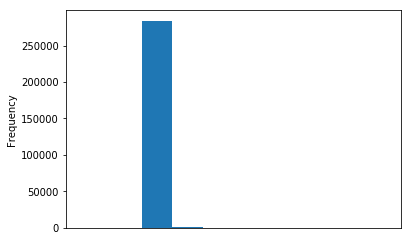

In [13]:
df['V7'].plot.hist()
plt.xticks(np.arange(df['V7'].min(), df['V7'].min(), step=0.1))

In [0]:
x=df.drop(['Class'],axis=1)
y=df['Class']

In [0]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3)

In [0]:
from sklearn.linear_model import LogisticRegression

logmodel=LogisticRegression()
logmodel.fit(x_train,y_train)
predictions1=logmodel.predict(x_test)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


In [0]:
from sklearn.metrics import classification_report
print(classification_report(y_test,predictions1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85310
           1       0.67      0.56      0.61       133

    accuracy                           1.00     85443
   macro avg       0.83      0.78      0.80     85443
weighted avg       1.00      1.00      1.00     85443



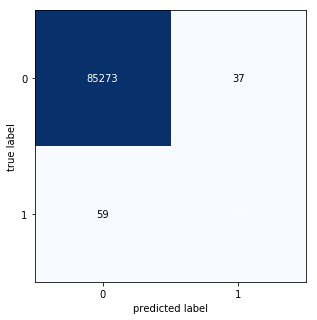

In [0]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
CM = confusion_matrix(y_test, predictions1)
from mlxtend.plotting import plot_confusion_matrix
fig, ax = plot_confusion_matrix(conf_mat=CM ,  figsize=(5, 5))
plt.show()

In [0]:
y_score = logmodel.decision_function(x_test)
from sklearn.metrics import average_precision_score
average_precision = average_precision_score(y_test, y_score)

print('Average precision-recall score: {0:0.2f}'.format(
      average_precision))
from sklearn.metrics import roc_auc_score
y_pred_prob = logmodel.predict_proba(x_test)
print('Average ROC_AUC score: {0:0.2f}'.format(roc_auc_score(y_test, y_pred_prob[:,1])))

Average precision-recall score: 0.50
Average ROC_AUC score: 0.90


Text(0.5, 1.0, '2-class Precision-Recall curve: AP=0.50')

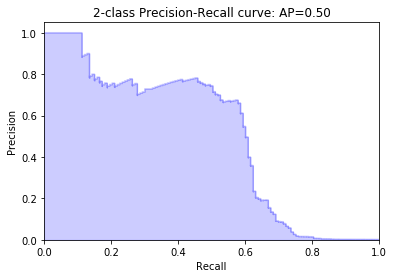

In [0]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt
from inspect import signature

precision, recall, _ = precision_recall_curve(y_test, y_score)

# In matplotlib < 1.5, plt.fill_between does not have a 'step' argument
step_kwargs = ({'step': 'post'}
               if 'step' in signature(plt.fill_between).parameters
               else {})
plt.step(recall, precision, color='b', alpha=0.2,
         where='post')
plt.fill_between(recall, precision, alpha=0.2, color='b', **step_kwargs)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-class Precision-Recall curve: AP={0:0.2f}'.format(
          average_precision))

In [0]:
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(n_estimators=200)
rfc.fit(x_train,y_train)
predictions2=rfc.predict(x_test)

In [0]:
print(classification_report(y_test,predictions2))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85304
           1       0.94      0.78      0.85       139

    accuracy                           1.00     85443
   macro avg       0.97      0.89      0.93     85443
weighted avg       1.00      1.00      1.00     85443



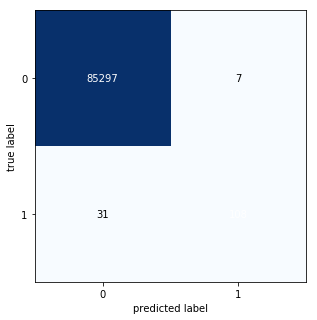

In [0]:
from sklearn.metrics import confusion_matrix
CM = confusion_matrix(y_test, predictions2)
from mlxtend.plotting import plot_confusion_matrix
fig, ax = plot_confusion_matrix(conf_mat=CM ,  figsize=(5, 5))
plt.show()

In [0]:
from sklearn.metrics import roc_auc_score
y_pred_proba = rfc.predict_proba(x_test)
print('Average ROC_AUC score: {0:0.2f}'.format(roc_auc_score(y_test, y_pred_proba[:,1])))

Average ROC_AUC score: 0.95


In [0]:
import tensorflow as tf
model = tf.keras.Sequential([
    tf.keras.layers.Dense(16,activation='relu',input_dim=30),
    tf.keras.layers.Dense(8,activation='relu'),
    tf.keras.layers.Dense(4,activation='relu'),
    tf.keras.layers.Dense(2,activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

W0703 04:38:32.863393 139784799512448 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/init_ops.py:1251: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [0]:
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
num_epochs = 10
history=model.fit(x_train, y_train, epochs=num_epochs, validation_split=0.1)

W0703 03:01:38.112229 139813033191296 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/nn_impl.py:180: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 179427 samples, validate on 19937 samples
Epoch 1/10
179427/179427 [==============================] - 10s 54us/sample - loss: 0.5416 - acc: 0.9982 - val_loss: 0.0461 - val_acc: 0.9981
Epoch 2/10
179427/179427 [==============================] - 9s 52us/sample - loss: 0.0224 - acc: 0.9982 - val_loss: 0.0235 - val_acc: 0.9981
Epoch 3/10
179427/179427 [==============================] - 9s 51us/sample - loss: 0.0131 - acc: 0.9982 - val_loss: 0.0305 - val_acc: 0.9981
Epoch 4/10
179427/179427 [==============================] - 9s 52us/sample - loss: 0.0214 - acc: 0.9982 - val_loss: 0.0211 - val_acc: 0.9981
Epoch 5/10
179427/179427 [==============================] - 9s 52us/sample - loss: 0.0129 - acc: 0.9982 - val_loss: 0.0211 - val_acc: 0.9981
Epoch 6/10
179427/179427 [==============================] - 9s 52us/sample - loss: 0.0129 - acc: 0.9982 - val_loss: 0.0213 - val_acc: 0.9981
Epoch 7/10
179427/179427 [==============================] - 9s 51us/sample - loss: 0.0129 - acc: 0.998

In [0]:
import numpy as np
pred_prob_test_labels1=model.predict(x_test)
pred=[]
for i in range(len(pred_prob_test_labels1)):
  pred.append(np.argmax(pred_prob_test_labels1[i]))

In [0]:
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85304
           1       0.00      0.00      0.00       139

    accuracy                           1.00     85443
   macro avg       0.50      0.50      0.50     85443
weighted avg       1.00      1.00      1.00     85443



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


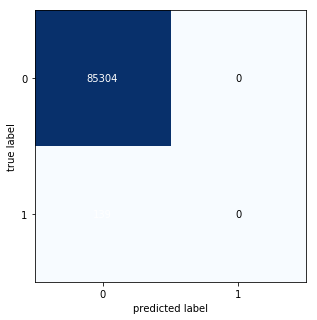

In [0]:
from sklearn.metrics import confusion_matrix
CM = confusion_matrix(y_test, pred)
from mlxtend.plotting import plot_confusion_matrix
fig, ax = plot_confusion_matrix(conf_mat=CM ,  figsize=(5, 5))
plt.show()

In [0]:
#Downsampling the dominant class
data = df.values.tolist()
import random
x_new=[]
y_new=[]
count=0
for i in range(len(data)):
  if data[i][30]==0.0:
    if count<492:
      count=count+1
      x_new.append(data[i][:-1])
      y_new.append(data[i][-1])
    else:
      break

for i in range(len(data)):
  if data[i][30]==1.0:
    x_new.append(data[i][:-1])
    y_new.append(data[i][-1])

In [0]:
x_train_new,x_test_new,y_train_new,y_test_new=train_test_split(x_new,y_new,test_size=0.1)

In [0]:
logmodel1=LogisticRegression()
logmodel1.fit(x_train_new,y_train_new)
pred1=logmodel1.predict(x_test_new)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


              precision    recall  f1-score   support

         0.0       1.00      0.62      0.77        45
         1.0       0.76      1.00      0.86        54

    accuracy                           0.83        99
   macro avg       0.88      0.81      0.82        99
weighted avg       0.87      0.83      0.82        99



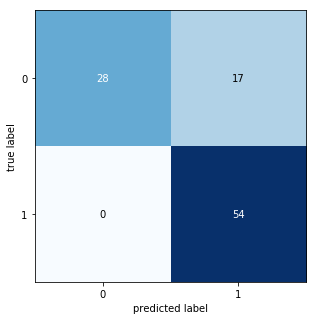

In [0]:
print(classification_report(y_test_new,pred1))
CM = confusion_matrix(y_test_new, pred1)
from mlxtend.plotting import plot_confusion_matrix
fig, ax = plot_confusion_matrix(conf_mat=CM ,  figsize=(5, 5))
plt.show()

              precision    recall  f1-score   support

           0       0.99      0.00      0.01     85310
           1       0.00      0.98      0.00       133

    accuracy                           0.01     85443
   macro avg       0.50      0.49      0.01     85443
weighted avg       0.99      0.01      0.01     85443



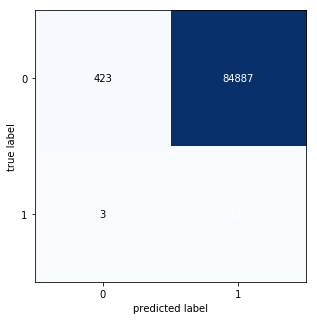

In [0]:
p1=logmodel1.predict(x_test)

print(classification_report(y_test,p1))

CM = confusion_matrix(y_test, p1)
from mlxtend.plotting import plot_confusion_matrix
fig, ax = plot_confusion_matrix(conf_mat=CM ,  figsize=(5, 5))
plt.show()


Average precision-recall score: 0.83
Average ROC_AUC score: 1.00


Text(0.5, 1.0, '2-class Precision-Recall curve: AP=0.83')

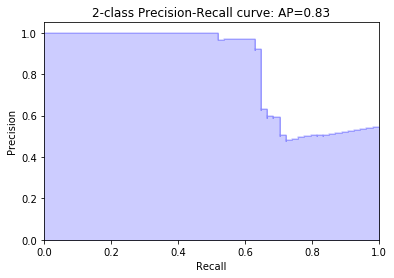

In [0]:
y_score_new = logmodel.decision_function(x_test_new)
from sklearn.metrics import average_precision_score
average_precision = average_precision_score(y_test_new , y_score_new )

print('Average precision-recall score: {0:0.2f}'.format(
      average_precision))
from sklearn.metrics import roc_auc_score
y_pred_prob_new  = logmodel1.predict_proba(x_test_new )
print('Average ROC_AUC score: {0:0.2f}'.format(roc_auc_score(y_test_new , y_pred_prob_new[:,1])))

precision, recall, _ = precision_recall_curve(y_test_new, y_score_new)

# In matplotlib < 1.5, plt.fill_between does not have a 'step' argument
step_kwargs = ({'step': 'post'}
               if 'step' in signature(plt.fill_between).parameters
               else {})
plt.step(recall, precision, color='b', alpha=0.2,
         where='post')
plt.fill_between(recall, precision, alpha=0.2, color='b', **step_kwargs)

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-class Precision-Recall curve: AP={0:0.2f}'.format(
          average_precision))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        45
         1.0       1.00      1.00      1.00        54

    accuracy                           1.00        99
   macro avg       1.00      1.00      1.00        99
weighted avg       1.00      1.00      1.00        99



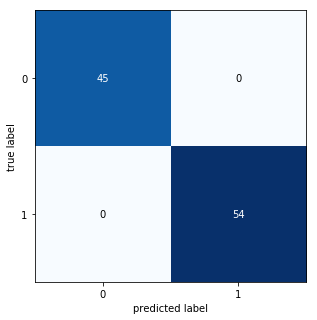

Average ROC_AUC score: 1.00


In [0]:
from sklearn.ensemble import RandomForestClassifier
rfc1=RandomForestClassifier(n_estimators=200)
rfc1.fit(x_train_new,y_train_new)
pred2=rfc1.predict(x_test_new)

print(classification_report(y_test_new,pred2))

CM = confusion_matrix(y_test_new, pred2)
from mlxtend.plotting import plot_confusion_matrix
fig, ax = plot_confusion_matrix(conf_mat=CM ,  figsize=(5, 5))
plt.show()

y_pred_proba_new = rfc1.predict_proba(x_test_new)
print('Average ROC_AUC score: {0:0.2f}'.format(roc_auc_score(y_test_new, y_pred_proba_new[:,1])))

              precision    recall  f1-score   support

           0       1.00      0.01      0.03     85310
           1       0.00      1.00      0.00       133

    accuracy                           0.02     85443
   macro avg       0.50      0.51      0.01     85443
weighted avg       1.00      0.02      0.03     85443



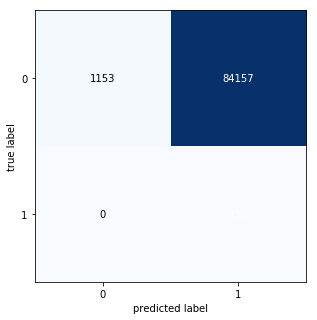

In [0]:
p2=rfc1.predict(x_test)

print(classification_report(y_test,p2))

CM = confusion_matrix(y_test, p2)
from mlxtend.plotting import plot_confusion_matrix
fig, ax = plot_confusion_matrix(conf_mat=CM ,  figsize=(5, 5))
plt.show()


Train on 796 samples, validate on 89 samples
Epoch 1/10
796/796 [==============================] - 0s 290us/sample - loss: 0.7804 - acc: 0.5427 - val_loss: 0.5708 - val_acc: 0.8090
Epoch 2/10
796/796 [==============================] - 0s 58us/sample - loss: 0.5420 - acc: 0.8656 - val_loss: 0.4967 - val_acc: 0.9438
Epoch 3/10
796/796 [==============================] - 0s 57us/sample - loss: 0.4813 - acc: 0.8078 - val_loss: 0.3563 - val_acc: 0.8202
Epoch 4/10
796/796 [==============================] - 0s 58us/sample - loss: 0.3649 - acc: 0.8266 - val_loss: 0.2964 - val_acc: 0.9775
Epoch 5/10
796/796 [==============================] - 0s 59us/sample - loss: 0.4037 - acc: 0.8254 - val_loss: 0.3181 - val_acc: 0.8764
Epoch 6/10
796/796 [==============================] - 0s 56us/sample - loss: 0.4080 - acc: 0.7626 - val_loss: 0.3552 - val_acc: 0.7640
Epoch 7/10
796/796 [==============================] - 0s 61us/sample - loss: 0.4435 - acc: 0.7626 - val_loss: 0.3081 - val_acc: 0.8764
Epoch 8/1

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


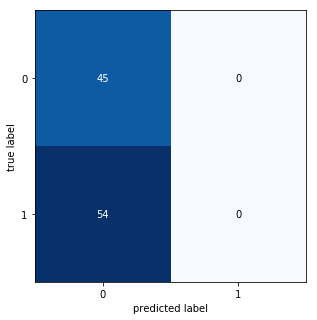

In [0]:
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
num_epochs = 10
history=model.fit(np.array(x_train_new), np.array(y_train_new), epochs=num_epochs, validation_split=0.1)

import numpy as np
pred_prob_test_labels1_new=model.predict(np.array(x_test_new))
pred3=[]
for i in range(len(pred_prob_test_labels1_new)):
  pred3.append(np.argmax(pred_prob_test_labels1_new[i]))

print(classification_report(y_test_new,pred3))

CM = confusion_matrix(y_test_new, pred3)
from mlxtend.plotting import plot_confusion_matrix
fig, ax = plot_confusion_matrix(conf_mat=CM ,  figsize=(5, 5))
plt.show()

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85310
           1       0.00      0.00      0.00       133

    accuracy                           1.00     85443
   macro avg       0.50      0.50      0.50     85443
weighted avg       1.00      1.00      1.00     85443



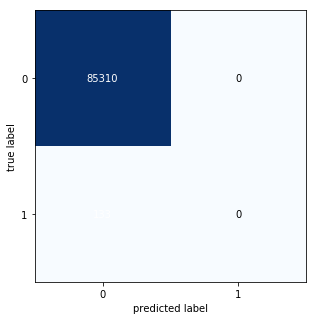

In [0]:
pred_prob_test_labels=model.predict(np.array(x_test))
p3=[]
for i in range(len(pred_prob_test_labels)):
  p3.append(np.argmax(pred_prob_test_labels[i]))

print(classification_report(y_test,p3))

CM = confusion_matrix(y_test, p3)
from mlxtend.plotting import plot_confusion_matrix
fig, ax = plot_confusion_matrix(conf_mat=CM ,  figsize=(5, 5))
plt.show()